# U-Net

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    # image_shifted = (image_tensor + 1) / 2
    image_shifted = image_tensor
    image_unflat = image_shifted.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=4)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

/home/ubuntu/anaconda3/envs/retrieval/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
class ContractingBlock(nn.Module):
    '''
    ContractingBlock Class
    Performs two convolutions followed by a max pool operation.
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels):
        super(ContractingBlock, self).__init__()
        # You want to double the number of channels in the first convolution
        # and keep the same number of channels in the second.

        self.conv1 = nn.Conv2d(in_channels=input_channels, out_channels=input_channels*2, kernel_size=3)
        self.conv2 = nn.Conv2d(in_channels=input_channels*2, out_channels=input_channels*2, kernel_size=3)
        self.activation = nn.ReLU()
        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        '''
        Function for completing a forward pass of ContractingBlock: 
        Given an image tensor, completes a contracting block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x = self.conv1(x)
        x = self.activation(x)
        x = self.conv2(x)
        x = self.activation(x)
        x = self.maxpool(x)
        return x
    
    # Required for grading
    def get_self(self):
        return self

In [5]:
def test_contracting_block(test_samples=100, test_channels=10, test_size=50):
    test_block = ContractingBlock(test_channels)
    test_in = torch.randn(test_samples, test_channels, test_size, test_size)
    test_out_conv1 = test_block.conv1(test_in)
    # Make sure that the first convolution has the right shape
    assert tuple(test_out_conv1.shape) == (test_samples, test_channels * 2, test_size - 2, test_size - 2)
    # Make sure that the right activation is used
    assert torch.all(test_block.activation(test_out_conv1) >= 0)
    assert torch.max(test_block.activation(test_out_conv1)) >= 1
    test_out_conv2 = test_block.conv2(test_out_conv1)
    # Make sure that the second convolution has the right shape
    assert tuple(test_out_conv2.shape) == (test_samples, test_channels * 2, test_size - 4, test_size - 4)
    test_out = test_block(test_in)
    # Make sure that the pooling has the right shape
    assert tuple(test_out.shape) == (test_samples, test_channels * 2, test_size // 2 - 2, test_size // 2 - 2)

test_contracting_block()
test_contracting_block(10, 9, 8)
print("Success!")

Success!


In [15]:
def crop(image, new_shape):
    '''
    Function for cropping an image tensor: Given an image tensor and the new shape,
    crops to the center pixels (assumes that the input's size and the new size are
    even numbers).
    Parameters:
        image: image tensor of shape (batch size, channels, height, width)
        new_shape: a torch.Size object with the shape you want x to have
    '''
    # There are many ways to implement this crop function, but it's what allows
    # the skip connection to function as intended with two differently sized images!
    
    middle_height = image.shape[2] // 2
    middle_width = image.shape[3] // 2
    starting_height = middle_height - new_shape[2] // 2
    final_height = starting_height + new_shape[2]
    starting_width = middle_width - new_shape[3] // 2
    final_width = starting_width + new_shape[3]
    cropped_image = image[:, :, starting_height:final_height, starting_width:final_width] 
    
    return cropped_image

In [16]:
def test_expanding_block_crop(test_samples=100, test_channels=10, test_size=100):
    # Make sure that the crop function is the right shape
    skip_con_x = torch.randn(test_samples, test_channels, test_size + 6, test_size + 6)
    x = torch.randn(test_samples, test_channels, test_size, test_size)
    cropped = crop(skip_con_x, x.shape)
    assert tuple(cropped.shape) == (test_samples, test_channels, test_size, test_size)

    # Make sure that the crop function takes the right area
    test_meshgrid = torch.meshgrid([torch.arange(0, test_size), torch.arange(0, test_size)])
    test_meshgrid = test_meshgrid[0] + test_meshgrid[1]
    test_meshgrid = test_meshgrid[None, None, :, :].float()
    cropped = crop(test_meshgrid, torch.Size([1, 1, test_size // 2, test_size // 2]))
    assert cropped.max() == (test_size - 1) * 2 - test_size // 2
    assert cropped.min() == test_size // 2
    assert cropped.mean() == test_size - 1

    test_meshgrid = torch.meshgrid([torch.arange(0, test_size), torch.arange(0, test_size)])
    test_meshgrid = test_meshgrid[0] + test_meshgrid[1]
    crop_size = 5
    test_meshgrid = test_meshgrid[None, None, :, :].float()
    cropped = crop(test_meshgrid, torch.Size([1, 1, crop_size, crop_size]))
    assert cropped.max() <= (test_size + crop_size - 1) and cropped.max() >= test_size - 1
    assert cropped.min() >= (test_size - crop_size - 1) and cropped.min() <= test_size - 1
    assert abs(cropped.mean() - test_size) <= 2

test_expanding_block_crop()
print("Success!")

Success!


/home/ubuntu/anaconda3/envs/retrieval/lib/python3.10/site-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1656352645774/work/aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [17]:
def test_expanding_block_crop(test_samples=100, test_channels=10, test_size=100):
    # Make sure that the crop function is the right shape
    skip_con_x = torch.randn(test_samples, test_channels, test_size + 6, test_size + 6)
    x = torch.randn(test_samples, test_channels, test_size, test_size)
    cropped = crop(skip_con_x, x.shape)
    assert tuple(cropped.shape) == (test_samples, test_channels, test_size, test_size)

    # Make sure that the crop function takes the right area
    test_meshgrid = torch.meshgrid([torch.arange(0, test_size), torch.arange(0, test_size)])
    test_meshgrid = test_meshgrid[0] + test_meshgrid[1]
    test_meshgrid = test_meshgrid[None, None, :, :].float()
    cropped = crop(test_meshgrid, torch.Size([1, 1, test_size // 2, test_size // 2]))
    assert cropped.max() == (test_size - 1) * 2 - test_size // 2
    assert cropped.min() == test_size // 2
    assert cropped.mean() == test_size - 1

In [20]:
class ExpandingBlock(nn.Module):
    '''
    ExpandingBlock Class
    Performs an upsampling, a convolution, a concatenation of its two inputs,
    followed by two more convolutions.
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels):
        super(ExpandingBlock, self).__init__()
        # "Every step in the expanding path consists of an upsampling of the feature map"
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        # "followed by a 2x2 convolution that halves the number of feature channels"
        # "a concatenation with the correspondingly cropped feature map from the contracting path"
        # "and two 3x3 convolutions"
        self.conv1 = nn.Conv2d(in_channels=input_channels, out_channels=input_channels//2, kernel_size=2)
        self.conv2 = nn.Conv2d(in_channels=input_channels, out_channels=input_channels//2, kernel_size=3)
        self.conv3 = nn.Conv2d(in_channels=input_channels//2, out_channels=input_channels//2, kernel_size=3)
        self.activation = nn.ReLU() # "each followed by a ReLU"
 
    def forward(self, x, skip_con_x):
        '''
        Function for completing a forward pass of ExpandingBlock: 
        Given an image tensor, completes an expanding block and returns the transformed tensor.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
            skip_con_x: the image tensor from the contracting path (from the opposing block of x)
                    for the skip connection
        '''
        x = self.upsample(x)
        x = self.conv1(x)
        skip_con_x = crop(skip_con_x, x.shape)
        x = torch.cat([x, skip_con_x], axis=1)
        x = self.conv2(x)
        x = self.activation(x)
        x = self.conv3(x)
        x = self.activation(x)
        return x
    
    # Required for grading
    def get_self(self):
        return self

In [21]:
def test_expanding_block(test_samples=100, test_channels=10, test_size=50):
    test_block = ExpandingBlock(test_channels)
    skip_con_x = torch.randn(test_samples, test_channels // 2, test_size * 2 + 6, test_size * 2 + 6)
    x = torch.randn(test_samples, test_channels, test_size, test_size)
    x = test_block.upsample(x)
    x = test_block.conv1(x)
    # Make sure that the first convolution produces the right shape
    assert tuple(x.shape) == (test_samples, test_channels // 2,  test_size * 2 - 1, test_size * 2 - 1)
    orginal_x = crop(skip_con_x, x.shape)
    x = torch.cat([x, orginal_x], axis=1)
    x = test_block.conv2(x)
    # Make sure that the second convolution produces the right shape
    assert tuple(x.shape) == (test_samples, test_channels // 2,  test_size * 2 - 3, test_size * 2 - 3)
    x = test_block.conv3(x)
    # Make sure that the final convolution produces the right shape
    assert tuple(x.shape) == (test_samples, test_channels // 2,  test_size * 2 - 5, test_size * 2 - 5)
    x = test_block.activation(x)

test_expanding_block_crop()
test_expanding_block()
print("Success!")

Success!


In [22]:
class FeatureMapBlock(nn.Module):
    '''
    FeatureMapBlock Class
    The final layer of a UNet - 
    maps each pixel to a pixel with the correct number of output dimensions
    using a 1x1 convolution.
    Values:
        input_channels: the number of channels to expect from a given input
    '''
    def __init__(self, input_channels, output_channels):
        super(FeatureMapBlock, self).__init__()
        # "Every step in the expanding path consists of an upsampling of the feature map"
        #### START CODE HERE ####
        self.conv = nn.Conv2d(input_channels, output_channels, kernel_size=1)
        #### END CODE HERE ####

    def forward(self, x):
        '''
        Function for completing a forward pass of FeatureMapBlock: 
        Given an image tensor, returns it mapped to the desired number of channels.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        x = self.conv(x)
        return x

In [23]:
assert tuple(FeatureMapBlock(10, 60)(torch.randn(1, 10, 10, 10)).shape) == (1, 60, 10, 10)
print("Success!")

Success!


In [24]:
class UNet(nn.Module):
    '''
    UNet Class
    A series of 4 contracting blocks followed by 4 expanding blocks to 
    transform an input image into the corresponding paired image, with an upfeature
    layer at the start and a downfeature layer at the end
    Values:
        input_channels: the number of channels to expect from a given input
        output_channels: the number of channels to expect for a given output
    '''
    def __init__(self, input_channels, output_channels, hidden_channels=64):
        super(UNet, self).__init__()
        # "Every step in the expanding path consists of an upsampling of the feature map"
        self.upfeature = FeatureMapBlock(input_channels, hidden_channels)
        self.contract1 = ContractingBlock(hidden_channels)
        self.contract2 = ContractingBlock(hidden_channels * 2)
        self.contract3 = ContractingBlock(hidden_channels * 4)
        self.contract4 = ContractingBlock(hidden_channels * 8)
        self.expand1 = ExpandingBlock(hidden_channels * 16)
        self.expand2 = ExpandingBlock(hidden_channels * 8)
        self.expand3 = ExpandingBlock(hidden_channels * 4)
        self.expand4 = ExpandingBlock(hidden_channels * 2)
        self.downfeature = FeatureMapBlock(hidden_channels, output_channels)

    def forward(self, x):
        '''
        Function for completing a forward pass of UNet: 
        Given an image tensor, passes it through U-Net and returns the output.
        Parameters:
            x: image tensor of shape (batch size, channels, height, width)
        '''
        # Keep in mind that the expand function takes two inputs, 
        # both with the same number of channels. 
        #### START CODE HERE ####
        x0 = self.upfeature(x)
        x1 = self.contract1(x0)
        x2 = self.contract2(x1)
        x3 = self.contract3(x2)
        x4 = self.contract4(x3)
        x5 = self.expand1(x4, x3)
        x6 = self.expand2(x5, x2)
        x7 = self.expand3(x6, x1)
        x8 = self.expand4(x7, x0)
        xn = self.downfeature(x8)
        #### END CODE HERE ####
        return xn

In [25]:
test_unet = UNet(1, 3)
assert tuple(test_unet(torch.randn(1, 1, 256, 256)).shape) == (1, 3, 117, 117)
print("Success!")

Success!


In [28]:
import torch.nn.functional as F
from skimage import io
import numpy as np
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
input_dim = 1
label_dim = 1
display_step = 20
batch_size = 4
lr = 0.0002
initial_shape = 512
target_shape = 373
device = 'cuda'
volumes = torch.Tensor(io.imread('train-volume.tif'))[:, None, :, :] / 255
labels = torch.Tensor(io.imread('train-labels.tif', plugin="tifffile"))[:, None, :, :] / 255
labels = crop(labels, torch.Size([len(labels), 1, target_shape, target_shape]))
dataset = torch.utils.data.TensorDataset(volumes, labels)

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 0: Step 0: U-Net loss: 0.6638070940971375


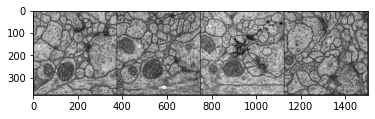

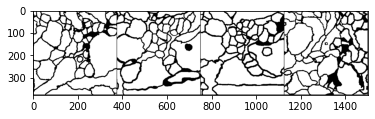

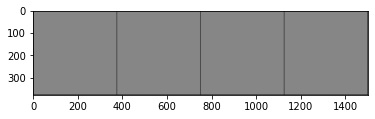

 50%|█████     | 4/8 [00:00<00:00,  7.83it/s]

Epoch 2: Step 20: U-Net loss: 0.5326788425445557


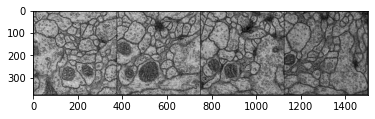

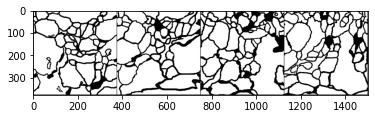

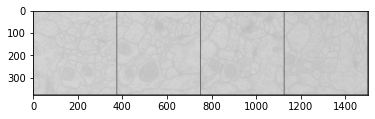

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 5: Step 40: U-Net loss: 0.4749610722064972


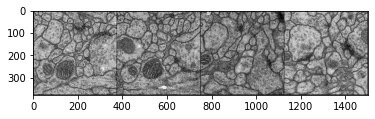

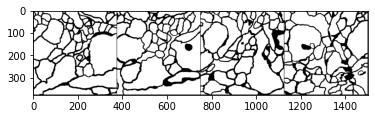

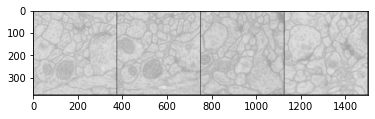

 50%|█████     | 4/8 [00:00<00:00,  7.91it/s]

Epoch 7: Step 60: U-Net loss: 0.38120120763778687


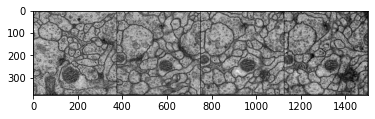

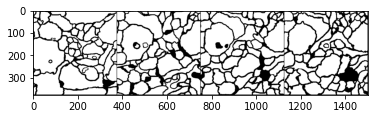

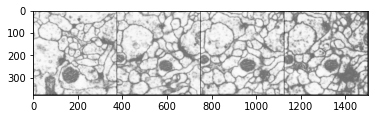

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 10: Step 80: U-Net loss: 0.36819830536842346


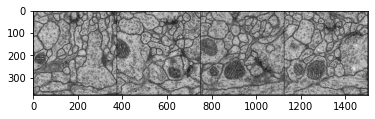

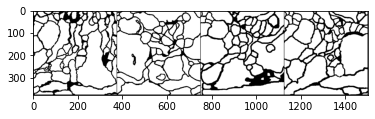

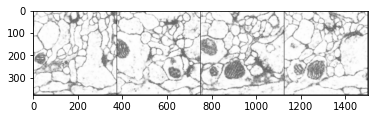

 50%|█████     | 4/8 [00:00<00:00,  8.02it/s]

Epoch 12: Step 100: U-Net loss: 0.3601132929325104


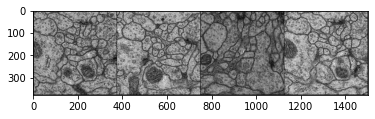

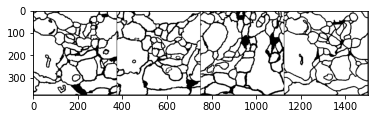

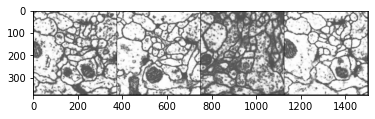

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 15: Step 120: U-Net loss: 0.4021606743335724


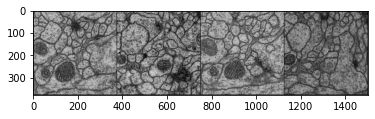

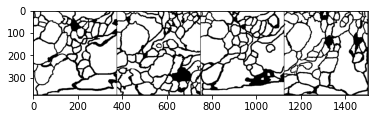

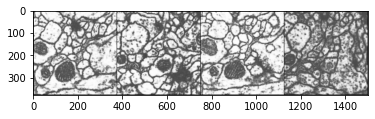

 50%|█████     | 4/8 [00:00<00:00,  8.02it/s]

Epoch 17: Step 140: U-Net loss: 0.2970314919948578


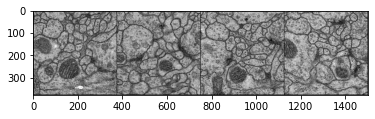

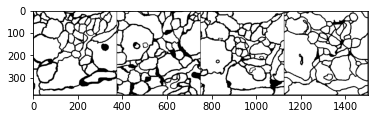

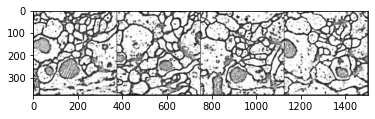

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 20: Step 160: U-Net loss: 0.31105053424835205


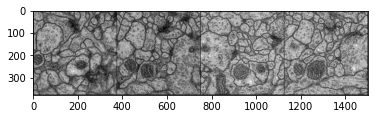

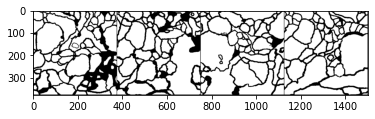

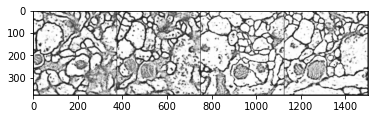

 50%|█████     | 4/8 [00:00<00:00,  7.87it/s]

Epoch 22: Step 180: U-Net loss: 0.304358571767807


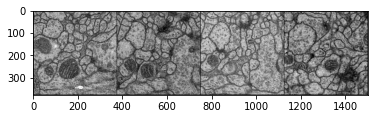

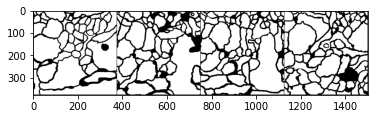

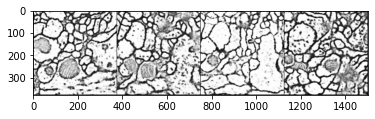

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 25: Step 200: U-Net loss: 0.2600554823875427


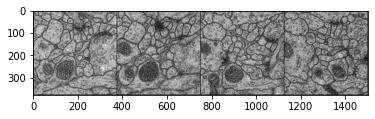

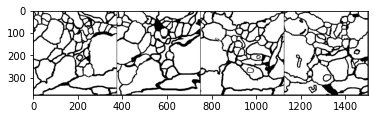

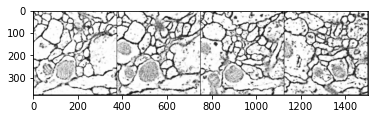

 50%|█████     | 4/8 [00:00<00:00,  7.97it/s]

Epoch 27: Step 220: U-Net loss: 0.28984275460243225


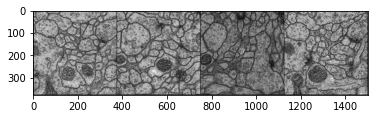

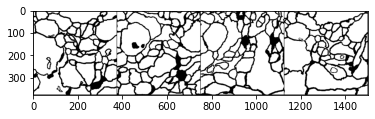

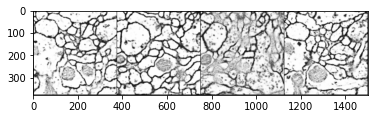

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 30: Step 240: U-Net loss: 0.2704581320285797


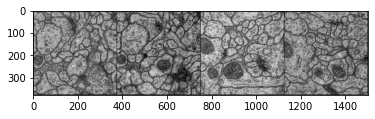

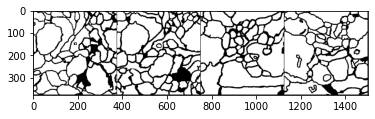

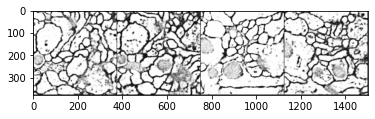

 50%|█████     | 4/8 [00:00<00:00,  7.90it/s]

Epoch 32: Step 260: U-Net loss: 0.2635263204574585


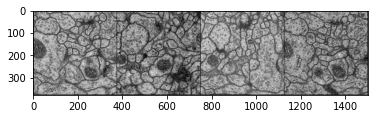

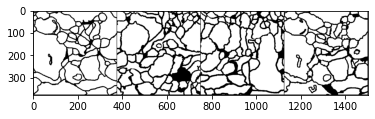

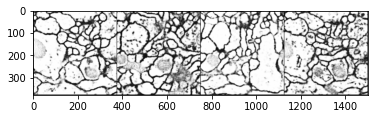

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 35: Step 280: U-Net loss: 0.2536080777645111


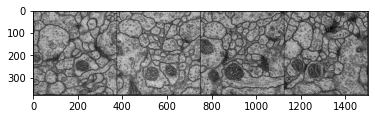

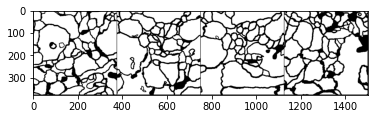

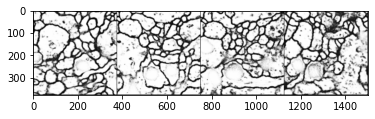

 50%|█████     | 4/8 [00:00<00:00,  7.80it/s]

Epoch 37: Step 300: U-Net loss: 0.2689001262187958


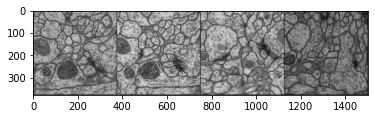

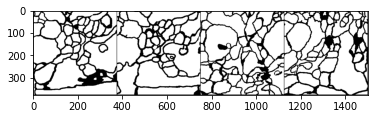

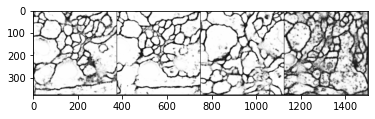

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 40: Step 320: U-Net loss: 0.2501409351825714


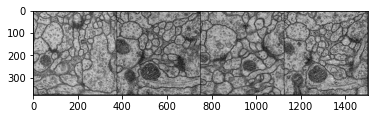

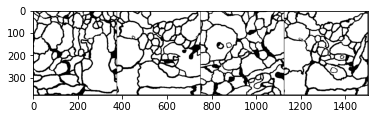

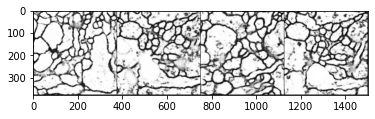

 50%|█████     | 4/8 [00:00<00:00,  7.70it/s]

Epoch 42: Step 340: U-Net loss: 0.28041839599609375


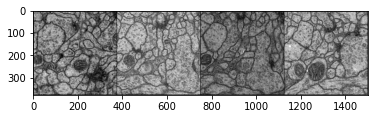

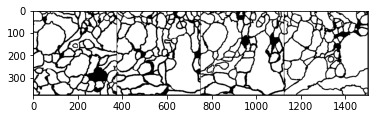

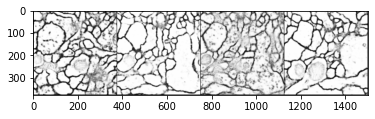

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 45: Step 360: U-Net loss: 0.22748136520385742


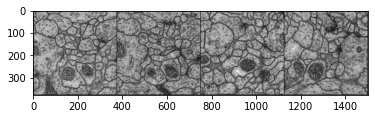

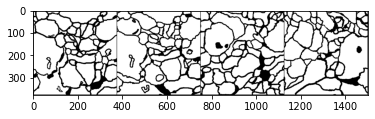

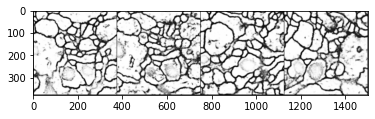

 50%|█████     | 4/8 [00:00<00:00,  7.79it/s]

Epoch 47: Step 380: U-Net loss: 0.22168754041194916


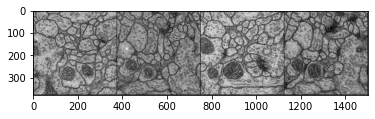

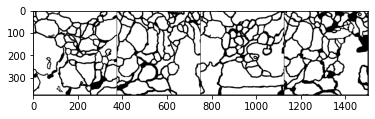

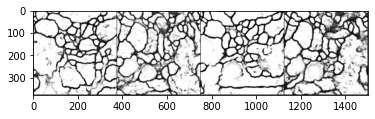

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 50: Step 400: U-Net loss: 0.20436500012874603


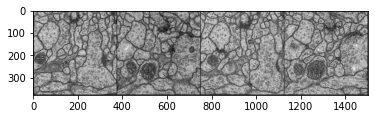

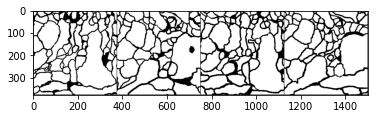

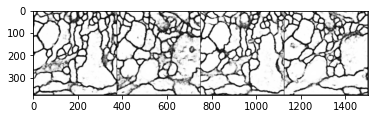

 50%|█████     | 4/8 [00:00<00:00,  7.78it/s]

Epoch 52: Step 420: U-Net loss: 0.21853511035442352


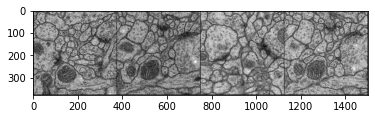

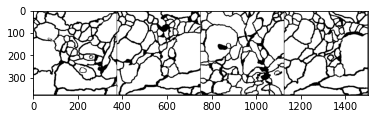

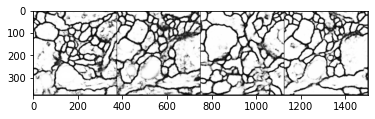

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 55: Step 440: U-Net loss: 0.2269655466079712


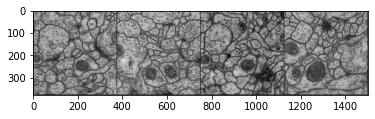

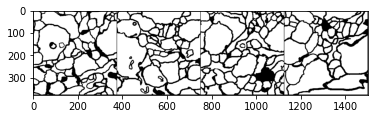

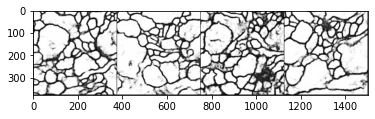

 50%|█████     | 4/8 [00:00<00:00,  7.88it/s]

Epoch 57: Step 460: U-Net loss: 0.2117856740951538


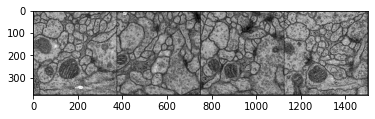

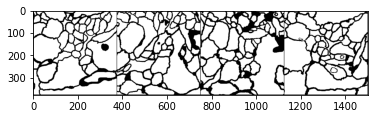

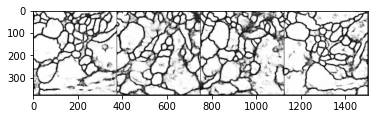

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 60: Step 480: U-Net loss: 0.18829229474067688


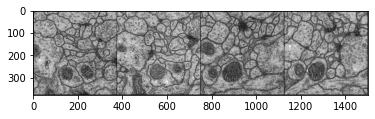

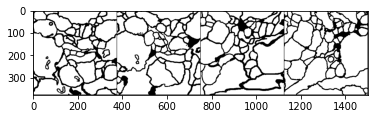

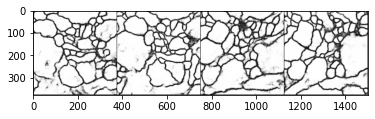

 50%|█████     | 4/8 [00:00<00:00,  7.80it/s]

Epoch 62: Step 500: U-Net loss: 0.1983869969844818


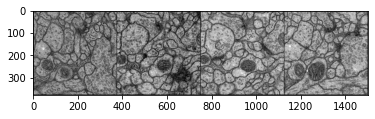

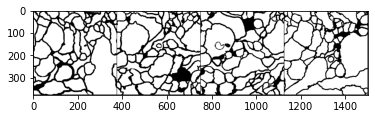

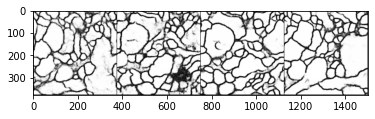

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 65: Step 520: U-Net loss: 0.1965278536081314


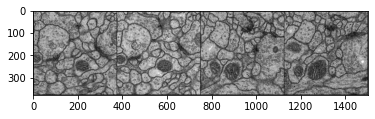

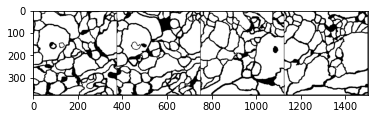

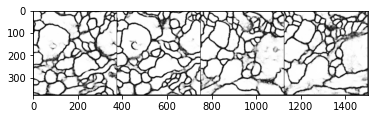

 50%|█████     | 4/8 [00:00<00:00,  7.95it/s]

Epoch 67: Step 540: U-Net loss: 0.20665617287158966


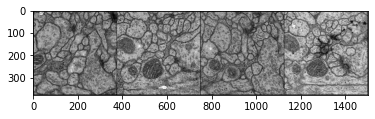

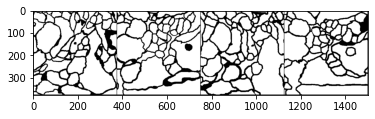

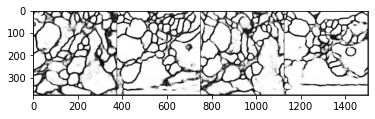

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 70: Step 560: U-Net loss: 0.2002311646938324


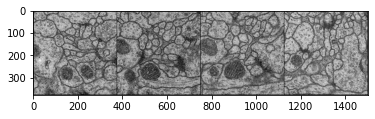

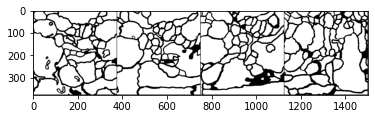

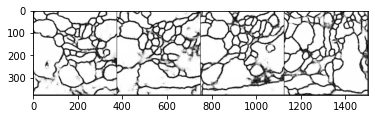

 50%|█████     | 4/8 [00:00<00:00,  7.90it/s]

Epoch 72: Step 580: U-Net loss: 0.18526960909366608


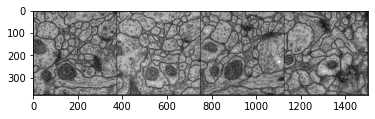

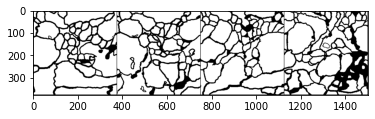

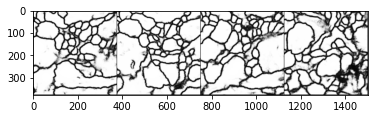

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 75: Step 600: U-Net loss: 0.1665843427181244


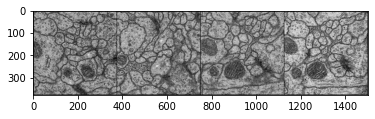

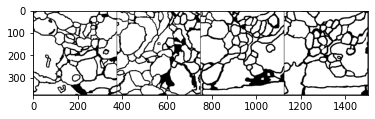

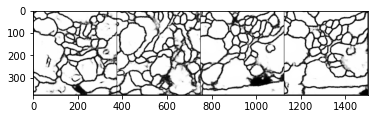

 50%|█████     | 4/8 [00:00<00:00,  7.85it/s]

Epoch 77: Step 620: U-Net loss: 0.1603325754404068


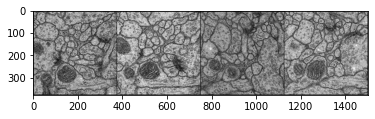

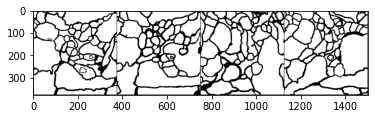

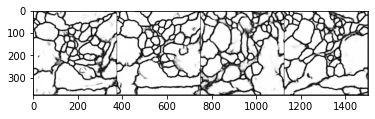

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 80: Step 640: U-Net loss: 0.17029759287834167


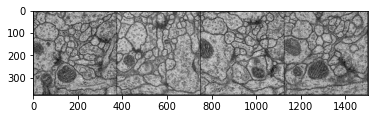

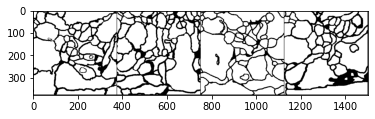

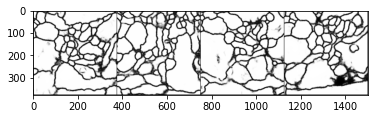

 50%|█████     | 4/8 [00:00<00:00,  7.78it/s]

Epoch 82: Step 660: U-Net loss: 0.17856192588806152


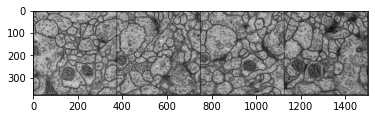

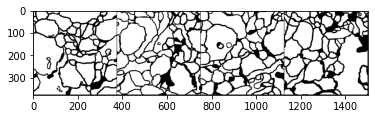

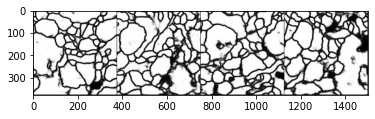

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 85: Step 680: U-Net loss: 0.16054745018482208


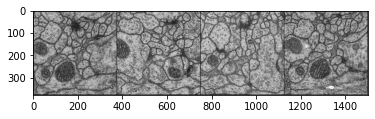

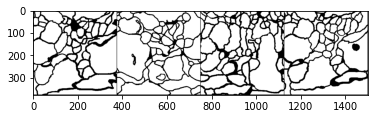

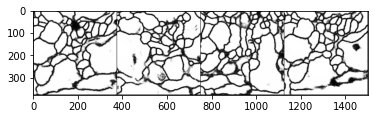

 50%|█████     | 4/8 [00:00<00:00,  7.79it/s]

Epoch 87: Step 700: U-Net loss: 0.17478667199611664


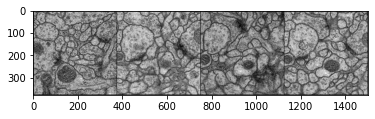

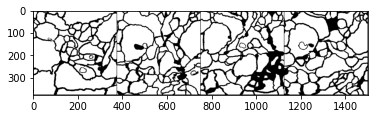

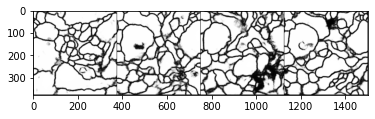

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 90: Step 720: U-Net loss: 0.14878197014331818


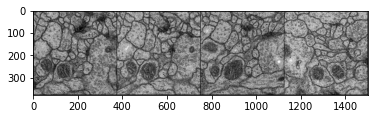

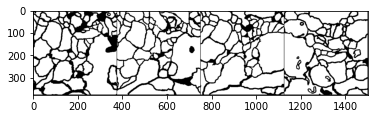

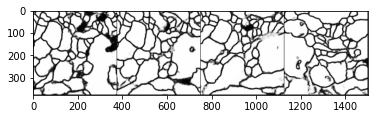

 50%|█████     | 4/8 [00:00<00:00,  7.86it/s]

Epoch 92: Step 740: U-Net loss: 0.13938626646995544


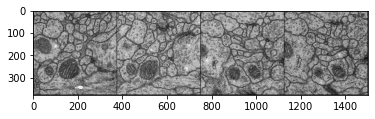

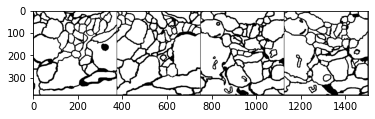

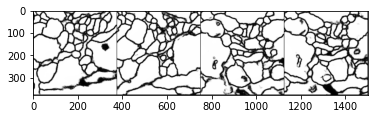

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 95: Step 760: U-Net loss: 0.152785986661911


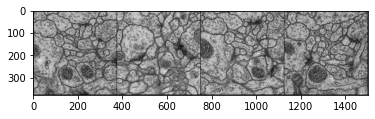

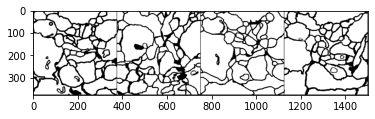

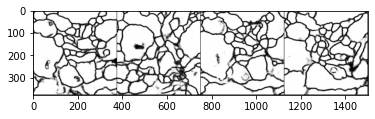

 50%|█████     | 4/8 [00:00<00:00,  7.91it/s]

Epoch 97: Step 780: U-Net loss: 0.13304530084133148


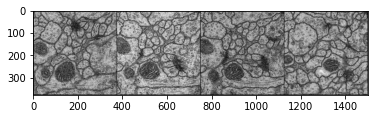

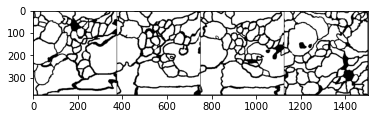

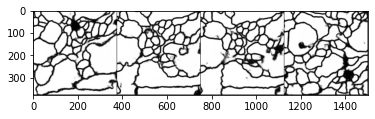

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 100: Step 800: U-Net loss: 0.13276763260364532


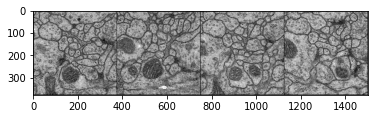

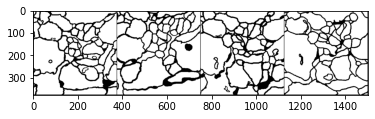

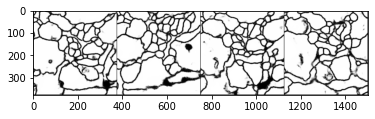

 50%|█████     | 4/8 [00:00<00:00,  7.95it/s]

Epoch 102: Step 820: U-Net loss: 0.13622775673866272


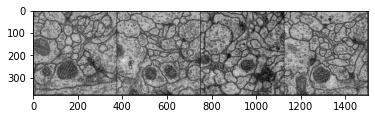

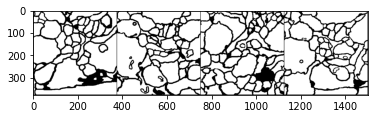

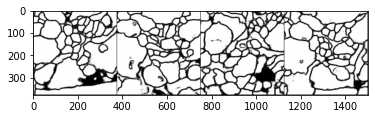

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 105: Step 840: U-Net loss: 0.1409553736448288


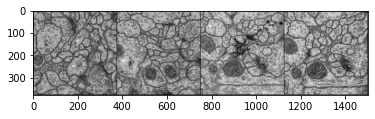

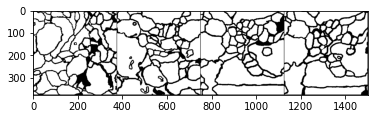

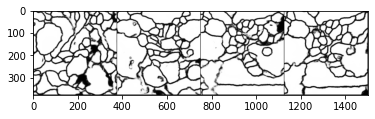

 50%|█████     | 4/8 [00:00<00:00,  7.74it/s]

Epoch 107: Step 860: U-Net loss: 0.13506188988685608


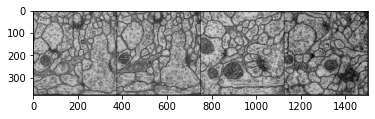

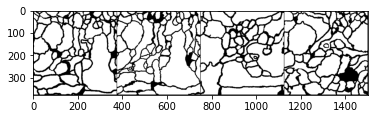

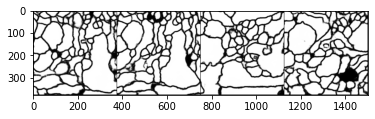

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 110: Step 880: U-Net loss: 0.126920685172081


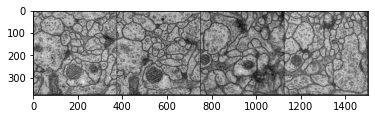

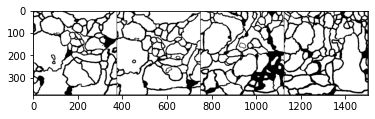

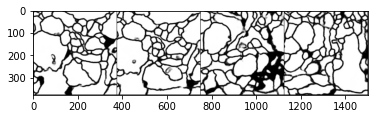

 50%|█████     | 4/8 [00:00<00:00,  7.72it/s]

Epoch 112: Step 900: U-Net loss: 0.11953264474868774


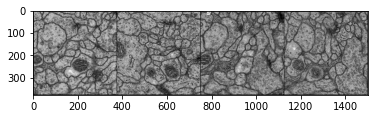

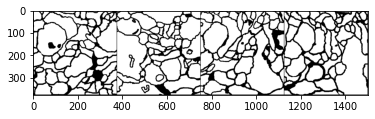

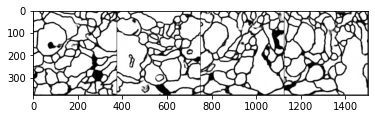

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 115: Step 920: U-Net loss: 0.11416997760534286


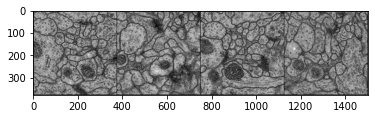

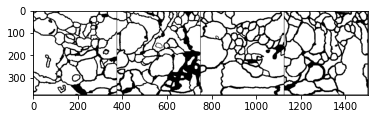

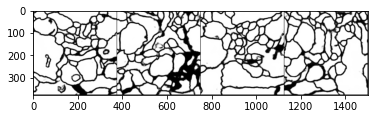

 50%|█████     | 4/8 [00:00<00:00,  7.87it/s]

Epoch 117: Step 940: U-Net loss: 0.12338753044605255


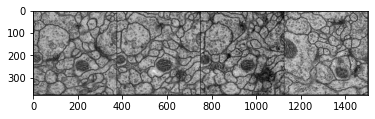

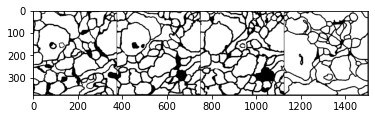

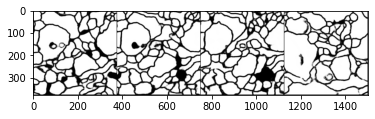

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 120: Step 960: U-Net loss: 0.12077789008617401


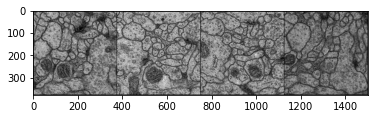

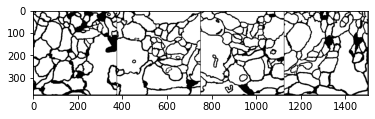

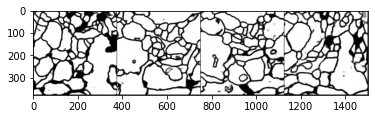

 50%|█████     | 4/8 [00:00<00:00,  7.86it/s]

Epoch 122: Step 980: U-Net loss: 0.10092435032129288


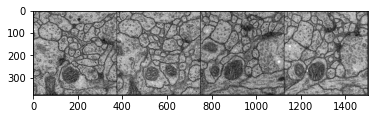

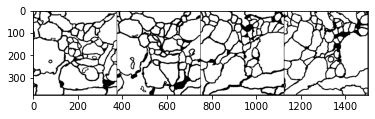

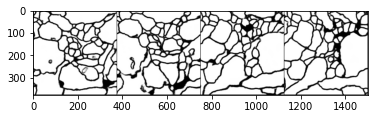

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 125: Step 1000: U-Net loss: 0.10164875537157059


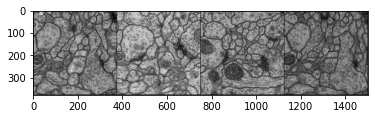

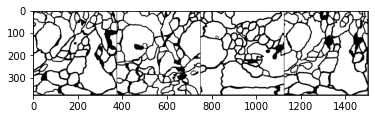

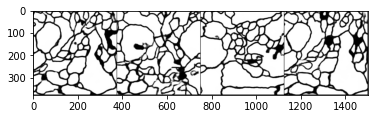

 50%|█████     | 4/8 [00:00<00:00,  7.87it/s]

Epoch 127: Step 1020: U-Net loss: 0.10345850884914398


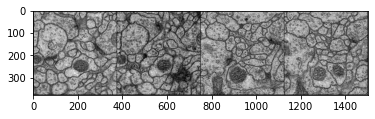

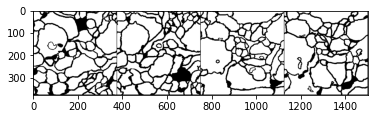

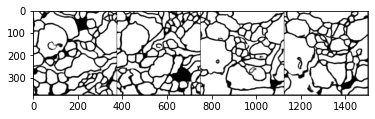

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 130: Step 1040: U-Net loss: 0.09596756845712662


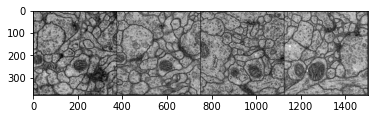

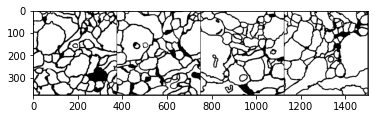

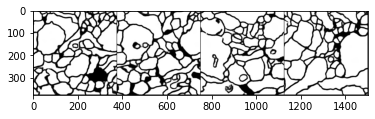

 50%|█████     | 4/8 [00:00<00:00,  7.72it/s]

Epoch 132: Step 1060: U-Net loss: 0.0896337553858757


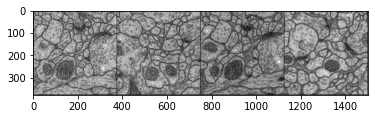

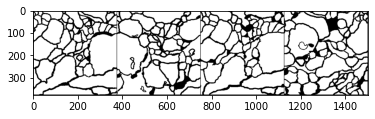

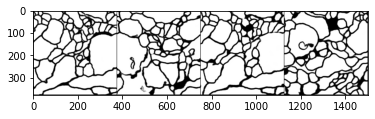

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 135: Step 1080: U-Net loss: 0.08876772224903107


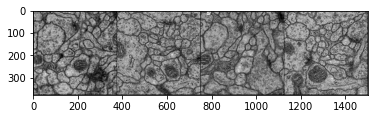

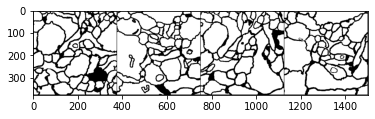

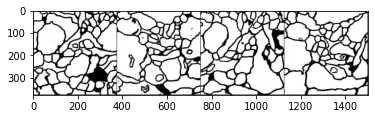

 50%|█████     | 4/8 [00:00<00:00,  7.85it/s]

Epoch 137: Step 1100: U-Net loss: 0.08765297383069992


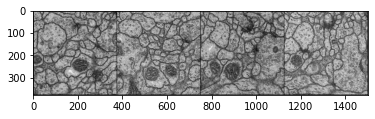

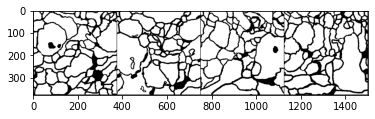

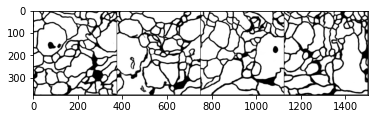

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 140: Step 1120: U-Net loss: 0.09054037928581238


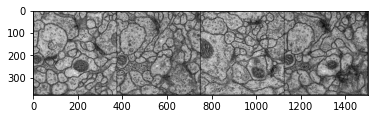

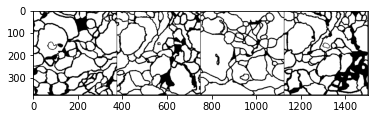

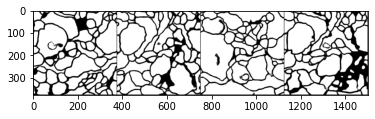

 50%|█████     | 4/8 [00:00<00:00,  7.85it/s]

Epoch 142: Step 1140: U-Net loss: 0.07446706295013428


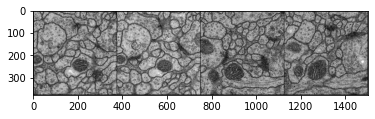

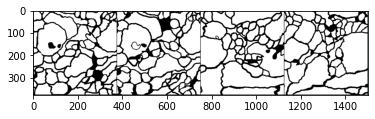

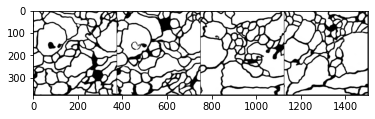

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 145: Step 1160: U-Net loss: 0.0865192860364914


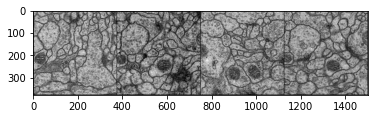

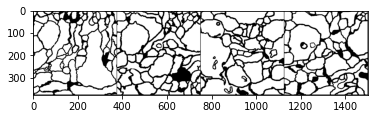

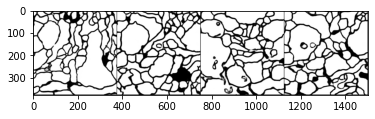

 50%|█████     | 4/8 [00:00<00:00,  7.90it/s]

Epoch 147: Step 1180: U-Net loss: 0.07483398914337158


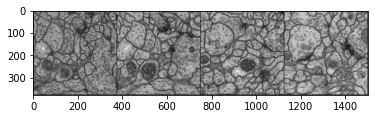

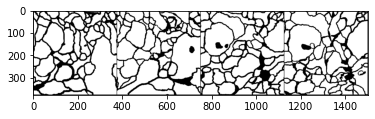

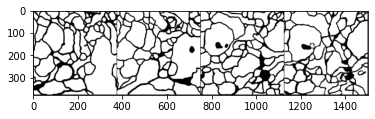

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 150: Step 1200: U-Net loss: 0.07315438240766525


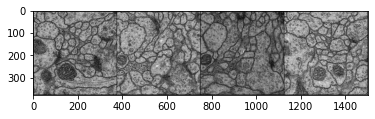

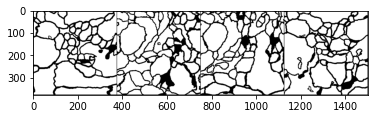

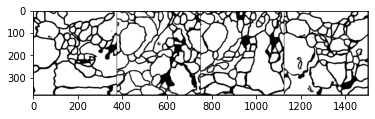

 50%|█████     | 4/8 [00:00<00:00,  7.82it/s]

Epoch 152: Step 1220: U-Net loss: 0.06301489472389221


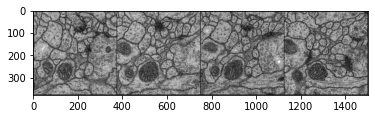

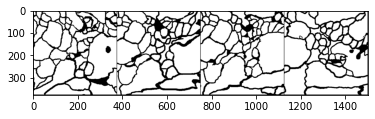

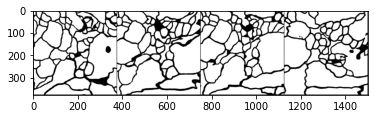

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 155: Step 1240: U-Net loss: 0.06313665211200714


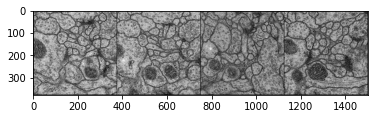

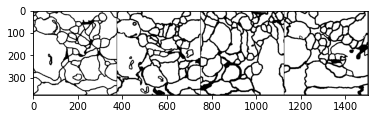

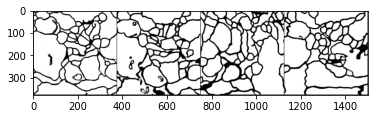

 50%|█████     | 4/8 [00:00<00:00,  7.73it/s]

Epoch 157: Step 1260: U-Net loss: 0.06392762064933777


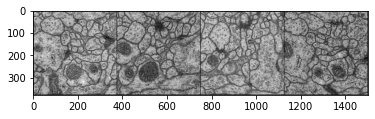

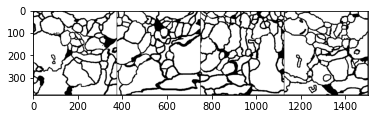

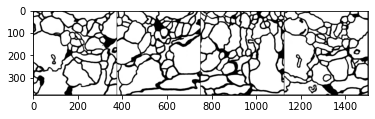

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 160: Step 1280: U-Net loss: 0.07361612468957901


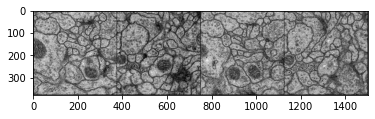

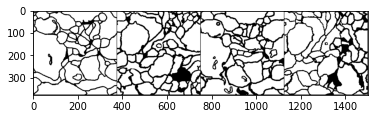

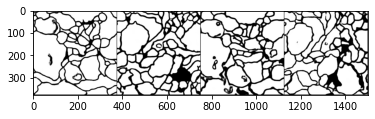

 50%|█████     | 4/8 [00:00<00:00,  7.86it/s]

Epoch 162: Step 1300: U-Net loss: 0.060496386140584946


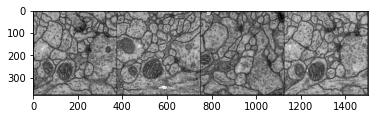

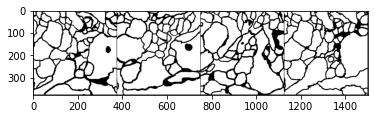

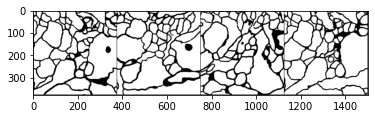

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 165: Step 1320: U-Net loss: 0.056513238698244095


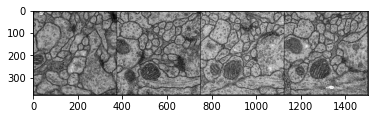

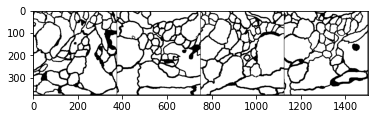

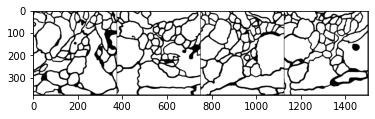

 50%|█████     | 4/8 [00:00<00:00,  7.86it/s]

Epoch 167: Step 1340: U-Net loss: 0.05914001539349556


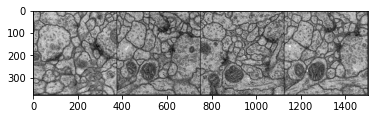

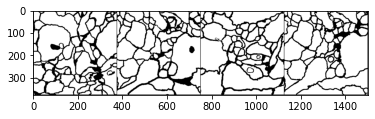

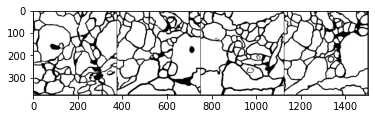

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 170: Step 1360: U-Net loss: 0.05448969081044197


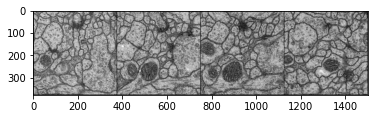

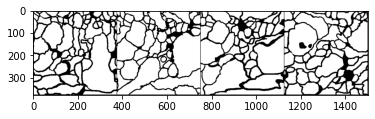

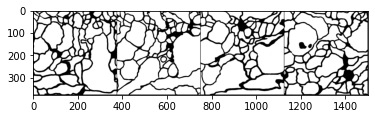

 50%|█████     | 4/8 [00:00<00:00,  7.80it/s]

Epoch 172: Step 1380: U-Net loss: 0.051566191017627716


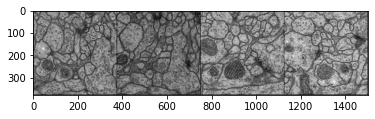

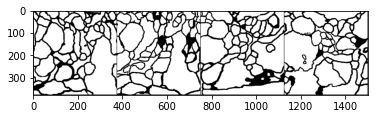

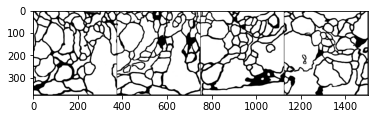

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 175: Step 1400: U-Net loss: 0.0509774349629879


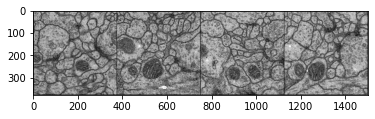

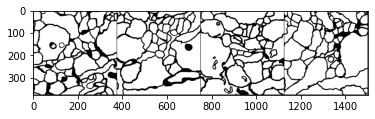

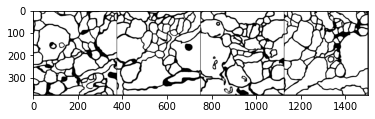

 50%|█████     | 4/8 [00:00<00:00,  7.86it/s]

Epoch 177: Step 1420: U-Net loss: 0.047724395990371704


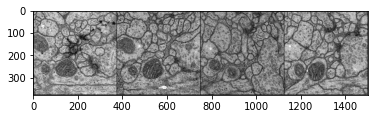

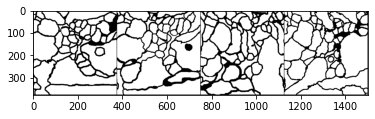

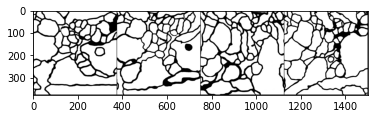

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 180: Step 1440: U-Net loss: 0.055663831532001495


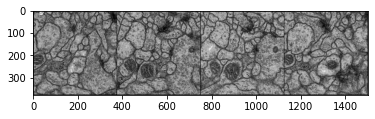

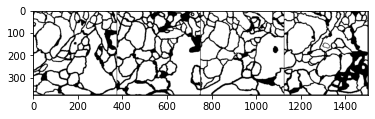

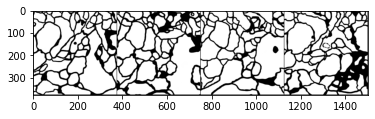

 50%|█████     | 4/8 [00:00<00:00,  7.80it/s]

Epoch 182: Step 1460: U-Net loss: 0.058041684329509735


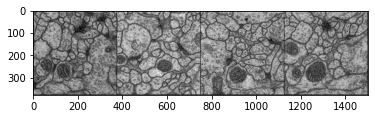

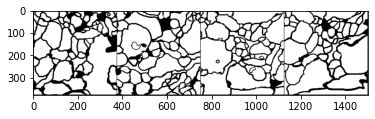

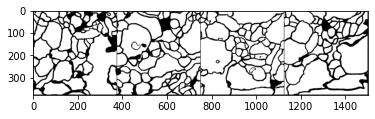

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 185: Step 1480: U-Net loss: 0.0551590733230114


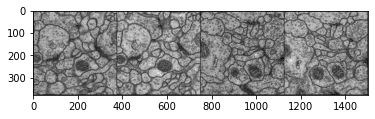

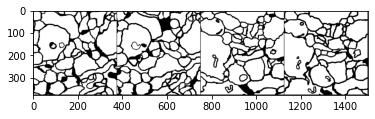

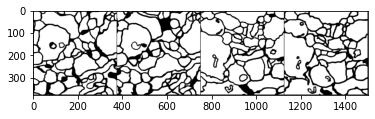

 50%|█████     | 4/8 [00:00<00:00,  7.86it/s]

Epoch 187: Step 1500: U-Net loss: 0.04573409631848335


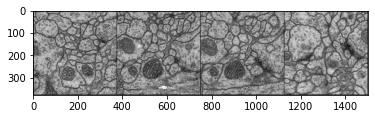

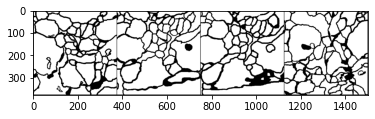

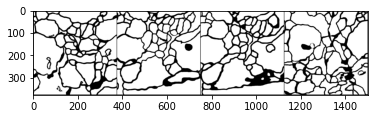

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 190: Step 1520: U-Net loss: 0.041497889906167984


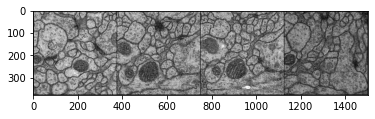

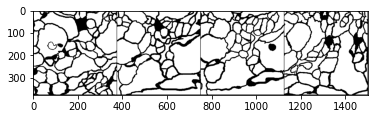

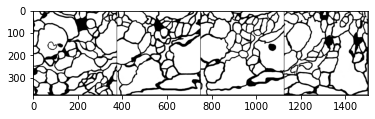

 50%|█████     | 4/8 [00:00<00:00,  7.88it/s]

Epoch 192: Step 1540: U-Net loss: 0.04061542823910713


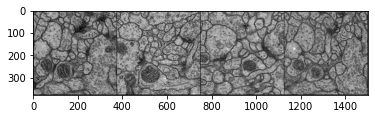

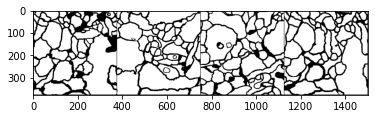

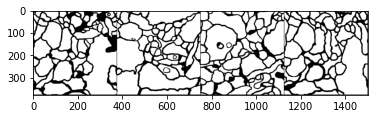

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch 195: Step 1560: U-Net loss: 0.04255914315581322


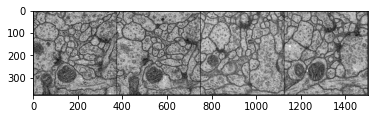

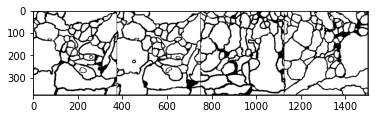

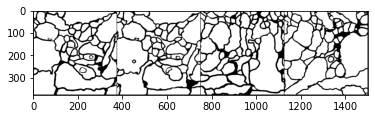

 50%|█████     | 4/8 [00:00<00:00,  7.78it/s]

Epoch 197: Step 1580: U-Net loss: 0.049730367958545685


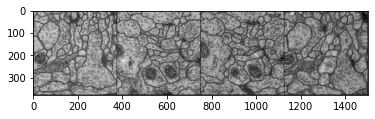

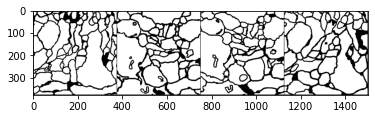

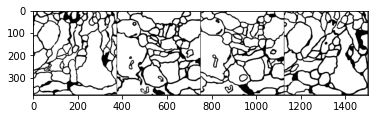

100%|██████████| 8/8 [00:01<00:00,  7.58it/s]


In [29]:
def train():
    dataloader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True)
    unet = UNet(input_dim, label_dim).to(device)
    unet_opt = torch.optim.Adam(unet.parameters(), lr=lr)
    cur_step = 0

    for epoch in range(n_epochs):
        for real, labels in tqdm(dataloader):
            cur_batch_size = len(real)
            # Flatten the image
            real = real.to(device)
            labels = labels.to(device)

            ### Update U-Net ###
            unet_opt.zero_grad()
            pred = unet(real)
            unet_loss = criterion(pred, labels)
            unet_loss.backward()
            unet_opt.step()

            if cur_step % display_step == 0:
                print(f"Epoch {epoch}: Step {cur_step}: U-Net loss: {unet_loss.item()}")
                show_tensor_images(
                    crop(real, torch.Size([len(real), 1, target_shape, target_shape])), 
                    size=(input_dim, target_shape, target_shape)
                )
                show_tensor_images(labels, size=(label_dim, target_shape, target_shape))
                show_tensor_images(torch.sigmoid(pred), size=(label_dim, target_shape, target_shape))
            cur_step += 1

train()